In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt


import torchvision.transforms as transforms
import torchvision.models as models

import copy

In [2]:
# if you have cuda
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
ITERATIONS = 20 # Number of iterations
IMAGE_WIDTH = 512 # 512x512 is fine for HD images
IMAGE_HEIGHT = 512
CONTENT_WEIGHT = 1 # Weight of the content loss
STYLE_WEIGHT = 0.01 # Weight og the style loss
TOTAL_VARIATION_WEIGHT = 15 # Weight of the total variation loss
INPUT_IMAGE = 'noise' # start with noise and get the final target

In [4]:
content_layers = ['conv_1', 'conv_2', 'conv_4']
style_layers = ['conv_2', 'conv_3', 'conv_4', 'conv_7', 'conv_10', 'conv_8']

In [5]:
content_image_path = "/content/content.png"
style_image_path = "/content/style.png"
output_image_path = "/content/result.png"
combined_image_path = "/content/combined.png"

In [6]:
# The function to download / open an image
def open_image(url):
  if url.startswith("http"):
    return Image.open(BytesIO(requests.get(url).content))
  else:
    return Image.open(url)


# **select the path of images**

In [7]:
# Content image

# Load image either by local device or by url ;
        # set the other as empty string
content_path = "/content/drive/My Drive/Colab Notebooks/Elizabeth.jpg"
content_url = ''

if content_url == '' :
    content_image = Image.open(content_path).convert("RGB")  # Ensure RGB format
else :
    content_image = open_image(content_url)

# Style image

# Load image either by local device or by url ;
        # set the other as empty string

style_path = "/content/drive/My Drive/Colab Notebooks/color-style.jpg"
style_url = ''

if style_url == '' :
    style_image = Image.open(style_path).convert("RGB")  # Ensure RGB format
else :
    style_image = open_image(content_url)


# **Load Images**


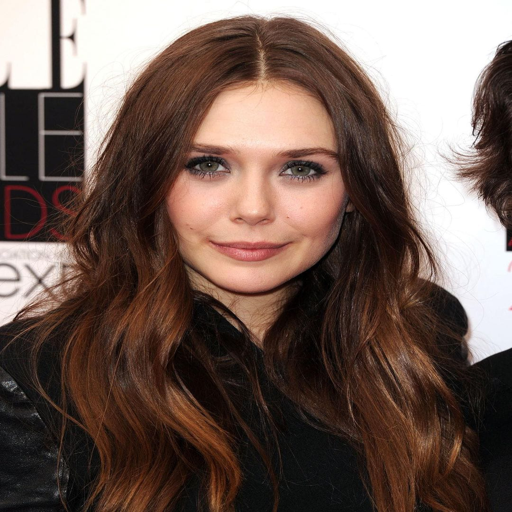

In [8]:
content_image = content_image.resize((IMAGE_WIDTH, IMAGE_HEIGHT))
content_image

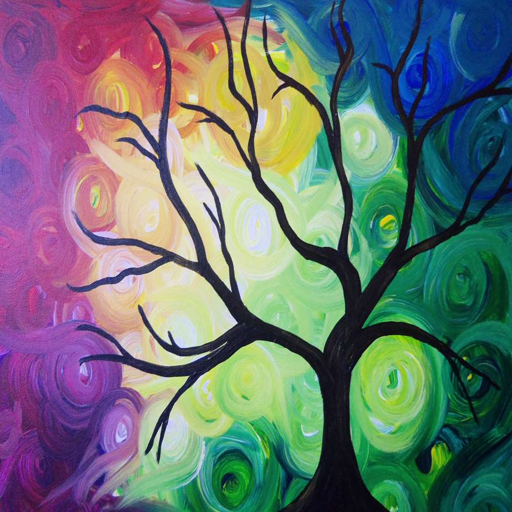

In [9]:
style_image = style_image.resize((IMAGE_WIDTH, IMAGE_HEIGHT))
style_image

# **Model**

In [10]:
class ContentLoss(nn.Module):
  def __init__(self, target,):
    super(ContentLoss, self).__init__()

    self.target = target.detach()

  def forward(self, input):
    self.loss = F.mse_loss(input, self.target)
    return input

In [11]:
class StyleLoss(nn.Module):
  def __init__(self, target_feature):
    super(StyleLoss, self).__init__()
    self.target = self.gram_matrix(target_feature).detach()

  def forward(self, input):
    G = self.gram_matrix(input)
    self.loss = F.mse_loss(G, self.target)
    return input

  @staticmethod
  def gram_matrix(input):
    a, b, c, d = input.size()
    features = input.view(a * b, c * d)

    # Compute the gram product
    G = torch.mm(features, features.t())
    return G.div((a * b * c * d) ** 0.5)

In [12]:
def total_variation_loss(x): # Expect a mini batch of dim NxWxH
  image_height = x.shape[1]
  image_width = x.shape[2]
  dx = x[:, :image_height-1, :image_width-1, :] - x[:, 1:, :image_width-1, :]
  dy = x[:, :image_height-1, :image_width-1, :] - x[:, :image_height-1, 1:, :]
  loss = (dx ** 2 + dy ** 2).sum() ** 0.5
  # Return loss normalized by image and batch size
  return loss / (image_width * image_height * x.shape[0])

In [13]:
class Normalization(nn.Module):
  def __init__(self, mean, std):
    super(Normalization, self).__init__()
    self.mean = torch.tensor(mean).view(-1, 1, 1)
    self.std = torch.tensor(std).view(-1, 1, 1)

  def forward(self, img):
    # Normalize img
    return (img - self.mean) / self.std

# Download the VGG19 **model**

In [14]:
# Neural network used.
cnn = models.vgg19(pretrained=True).features.to(device).eval()

# Normalization mean and standard deviation.
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:06<00:00, 84.4MB/s]


In [15]:
def get_model_and_losses(style_img, content_img,
                               cnn=cnn,
                               cnn_normalization_mean=cnn_normalization_mean,
                               cnn_normalization_std=cnn_normalization_std):
  # Make a deep copy of vgg19 in order to not modify the original
  cnn = copy.deepcopy(cnn)

  # Normalization module
  normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)

  # This list will contain the losses computed by the network.
  content_losses = []
  style_losses = []

  # Normalization layer.
  model = nn.Sequential(normalization)

  i = 0  # Incremented every time we see a conv layer.
  for layer in cnn.children():

    if isinstance(layer, nn.Conv2d):
        i += 1
        name = 'conv_{}'.format(i)
    elif isinstance(layer, nn.ReLU):
        name = 'relu_{}'.format(i)
        layer = nn.ReLU(inplace=False)
    elif isinstance(layer, nn.MaxPool2d):
        name = 'pool_{}'.format(i)
    elif isinstance(layer, nn.BatchNorm2d):
        name = 'bn_{}'.format(i)
    else:
        raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

    model.add_module(name, layer)

    if name in content_layers:
      target = model(content_img).detach()
      content_loss = ContentLoss(target)
      model.add_module("content_loss_{}".format(i), content_loss)
      content_losses.append(content_loss)

    if name in style_layers:
      target_feature = model(style_img).detach()
      style_loss = StyleLoss(target_feature)
      model.add_module("style_loss_{}".format(i), style_loss)
      style_losses.append(style_loss)


  for i in range(len(model) - 1, -1, -1):
      if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
          break

  model = model[:(i + 1)]

  return model, style_losses, content_losses

In [16]:
def image_to_tensor(image):
  # Transform to tensor
  image = transforms.ToTensor()(image)
  # Fake batch dimension required to fit network's input dimensions
  image = image.unsqueeze(0)
  # Move to the right device and convert to float
  return image.to(device, torch.float)

content_img = image_to_tensor(content_image)
style_img = image_to_tensor(style_image)

In [17]:
# Reconvert a tensor into PIL image
def tensor_to_image(tensor):
  img = (255 * tensor).cpu().detach().squeeze(0).numpy()
  img = img.clip(0, 255).transpose(1, 2, 0).astype("uint8")
  return Image.fromarray(img)

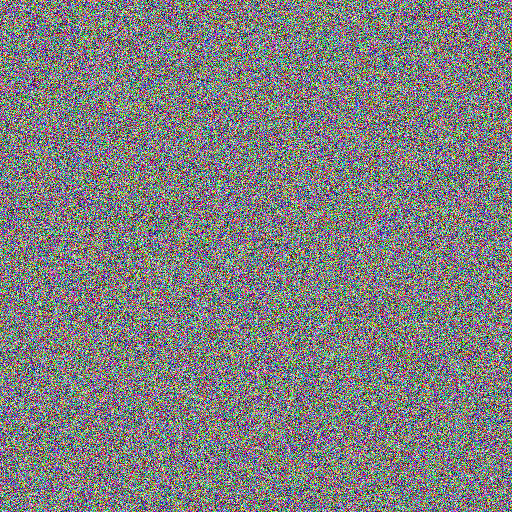

In [18]:
#@title This is the _input_ image
if INPUT_IMAGE == 'noise':
  input_img = torch.randn(content_img.data.size(), device=device)
elif INPUT_IMAGE == 'content':
  input_img = content_img.clone()
elif INPUT_IMAGE == 'style':
  input_img = style_img.clone()
else:
  image = open_image(INPUT_IMAGE).resize((IMAGE_SIZE, IMAGE_SIZE))
  input_img = image_to_tensor(image)
  input_img += torch.randn(content_img.data.size(), device=device)*0.1

if INPUT_IMAGE == 'noise':
  img = transforms.ToPILImage()(input_img[0].cpu())
else:
  img = tensor_to_image(input_img[0])
img

In [19]:
def get_input_optimizer(input_img):
  # This line tell LBFGS what parameters we should optimize
  optimizer = optim.LBFGS([input_img.requires_grad_()])
  #optimizer = optim.Adam([input_img.requires_grad_()])
  return optimizer

In [20]:
def show_evolution(tensor, history=[], title=None):
    image = tensor.cpu().clone().squeeze(0)
    image = tensor_to_image(image)
    # Display a big figure
    plt.rcParams['figure.figsize'] = [10, 5]
    plt.figure()
    # Image
    plt.subplot(121)
    plt.imshow(image)
    plt.axis('off')
    if title is not None:
        plt.title(title)
    # Losses
    ax = plt.subplot(122)
    plt.yscale('log')
    plt.title('Losses')
    import numpy as np
    history = np.array(history).T
    plt.plot(history[0], label='Style')
    plt.plot(history[1], label='Content')
    plt.plot(history[2], label='Variation')
    plt.plot(history[3], label='Sum')
    plt.legend(loc="upper right")

    plt.show()
    # Display a textual message
    print('Style Loss : {:4f} Content Loss: {:4f} Variation Loss: {:4f} Sum: {:4f}'.format(
        history[0][-1], history[1][-1], history[2][-1], history[3][-1]))

Building the style transfer model..


<ipython-input-13-aa4e31fb03d2>:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
<ipython-input-13-aa4e31fb03d2>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)


Optimizing..


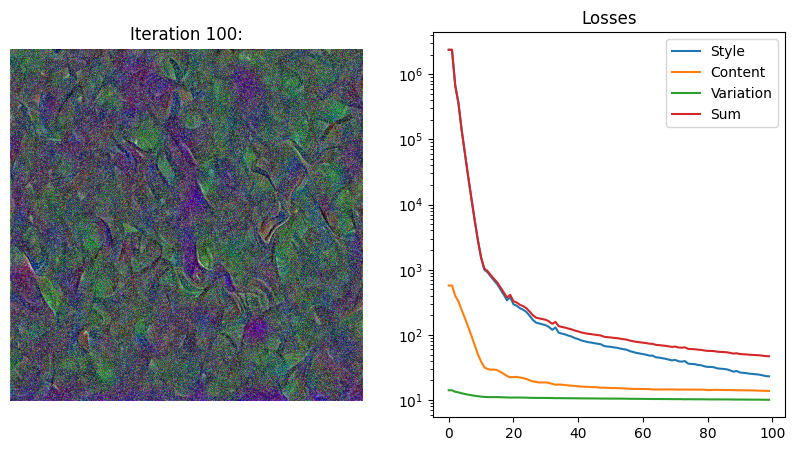

Style Loss : 23.130610 Content Loss: 13.793839 Variation Loss: 10.098001 Sum: 47.022446


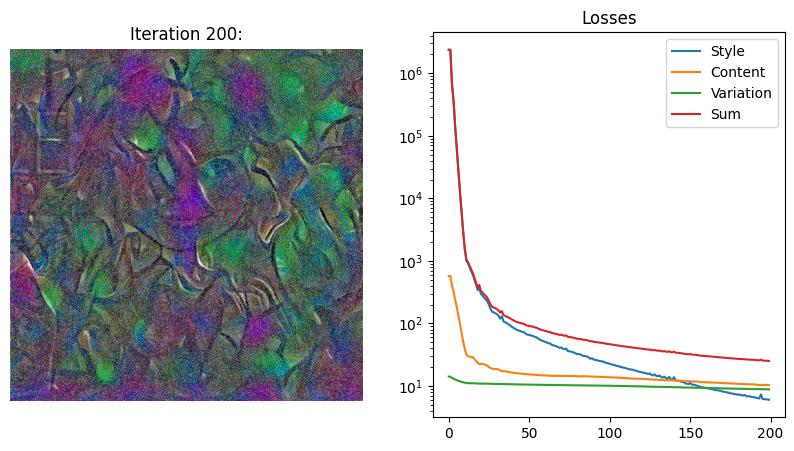

Style Loss : 6.021376 Content Loss: 10.326807 Variation Loss: 8.836619 Sum: 25.184803


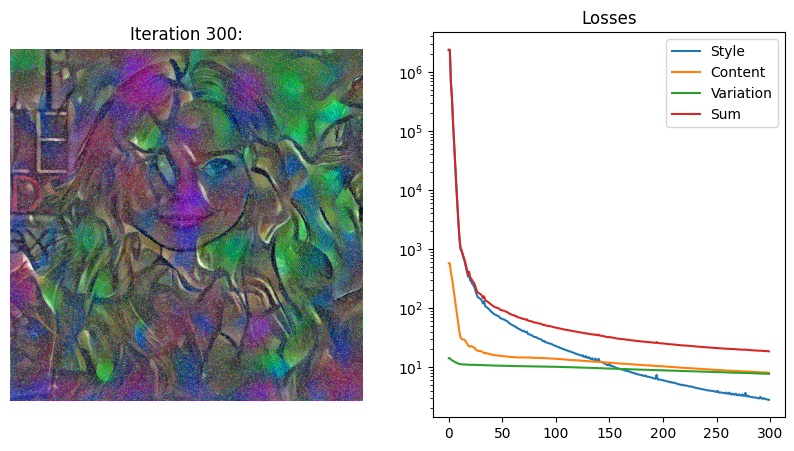

Style Loss : 2.789262 Content Loss: 8.016077 Variation Loss: 7.658409 Sum: 18.463749


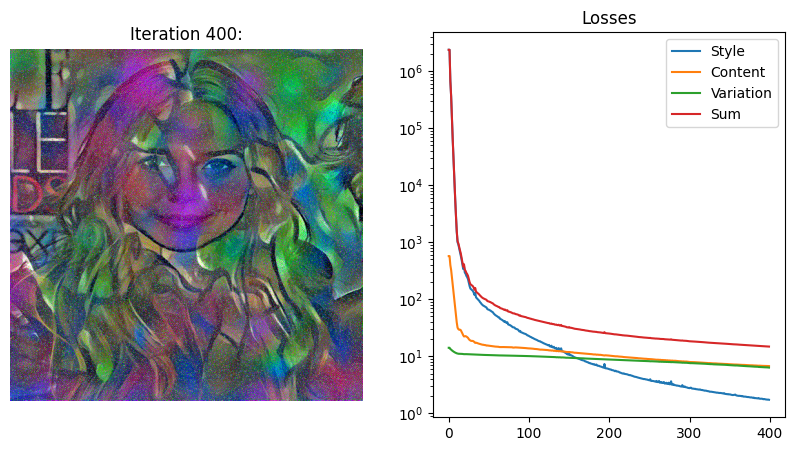

Style Loss : 1.730918 Content Loss: 6.746671 Variation Loss: 6.352921 Sum: 14.830509


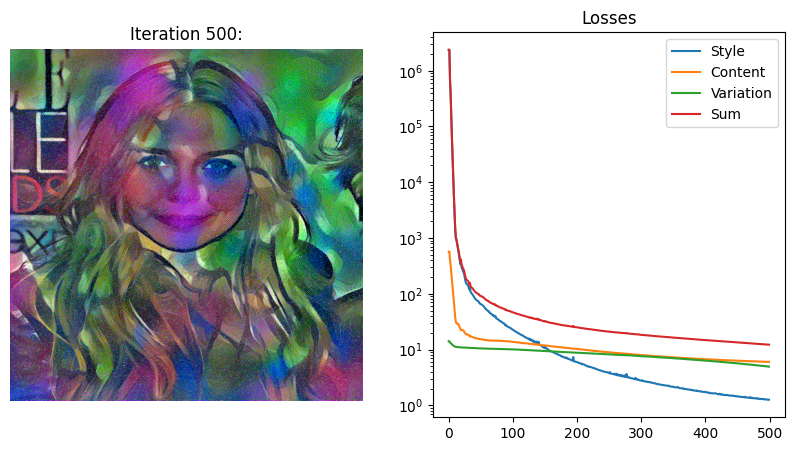

Style Loss : 1.264845 Content Loss: 6.026208 Variation Loss: 4.958824 Sum: 12.249878


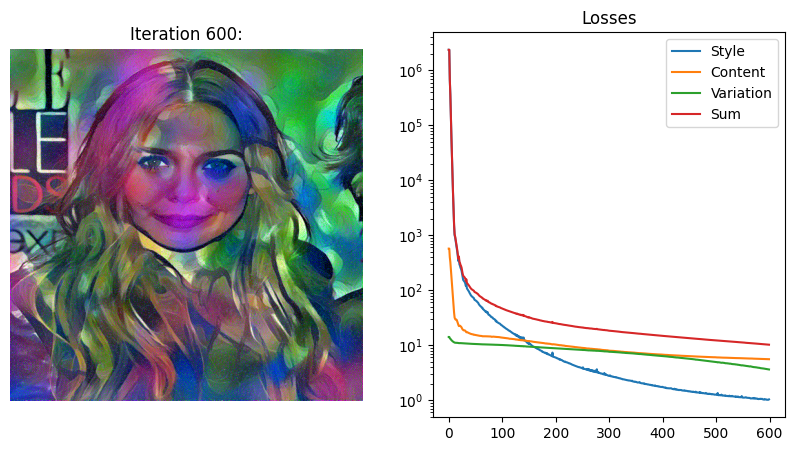

Style Loss : 1.034072 Content Loss: 5.569229 Variation Loss: 3.622789 Sum: 10.226090


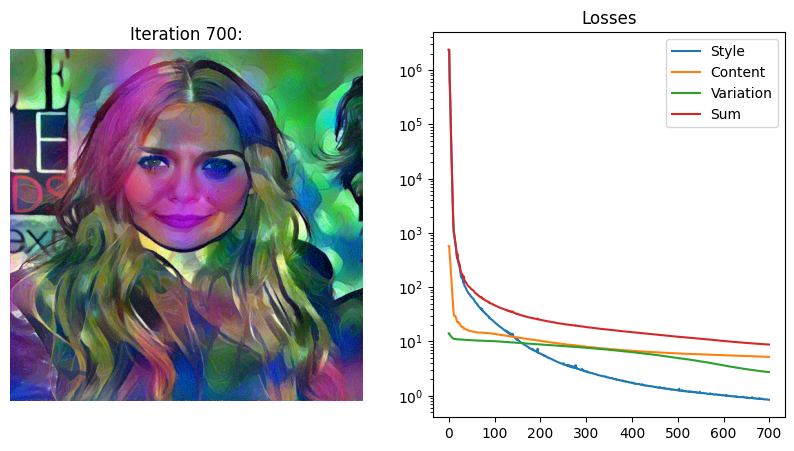

Style Loss : 0.841163 Content Loss: 5.197814 Variation Loss: 2.725188 Sum: 8.764164


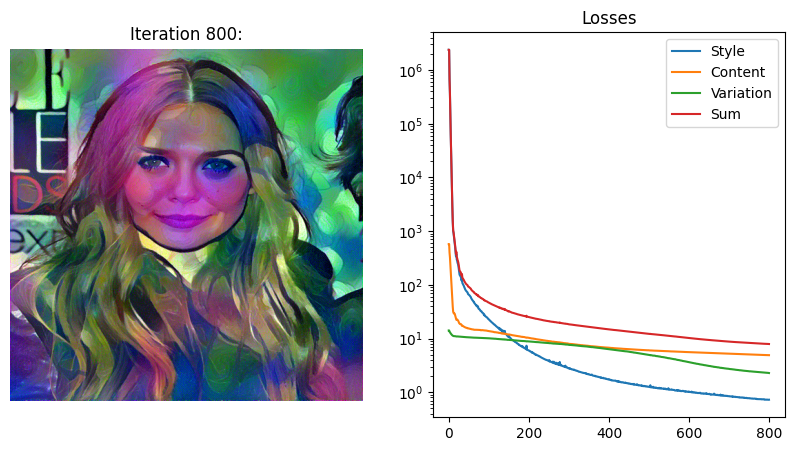

Style Loss : 0.725259 Content Loss: 4.897449 Variation Loss: 2.277218 Sum: 7.899927


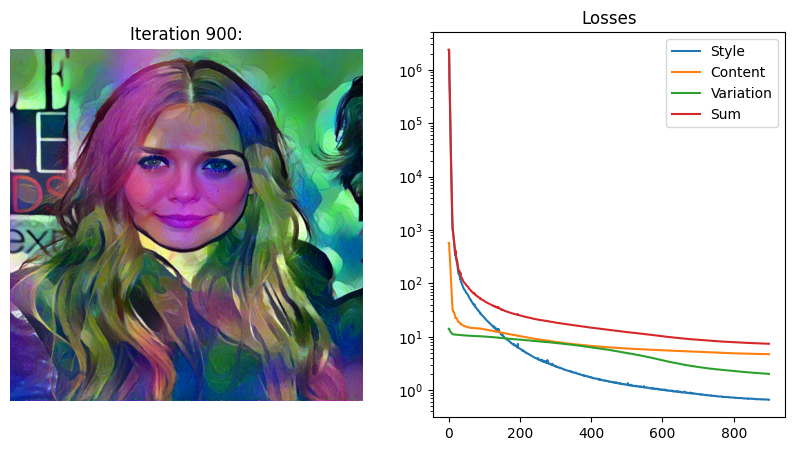

Style Loss : 0.658792 Content Loss: 4.710077 Variation Loss: 2.013506 Sum: 7.382375


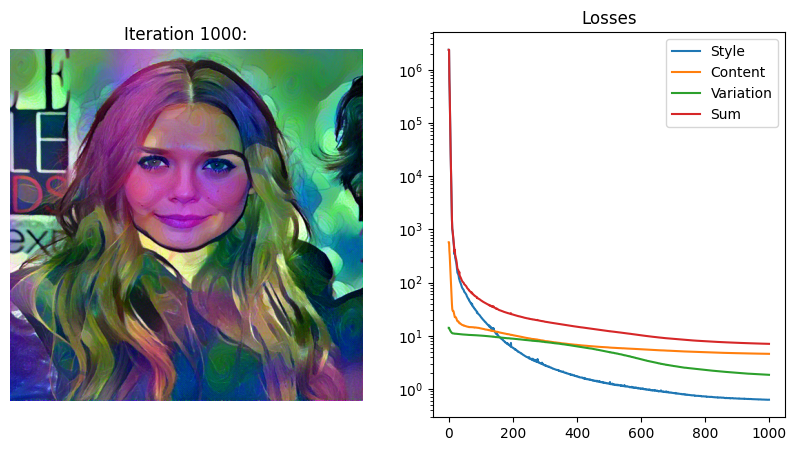

Style Loss : 0.628217 Content Loss: 4.577107 Variation Loss: 1.846331 Sum: 7.051655


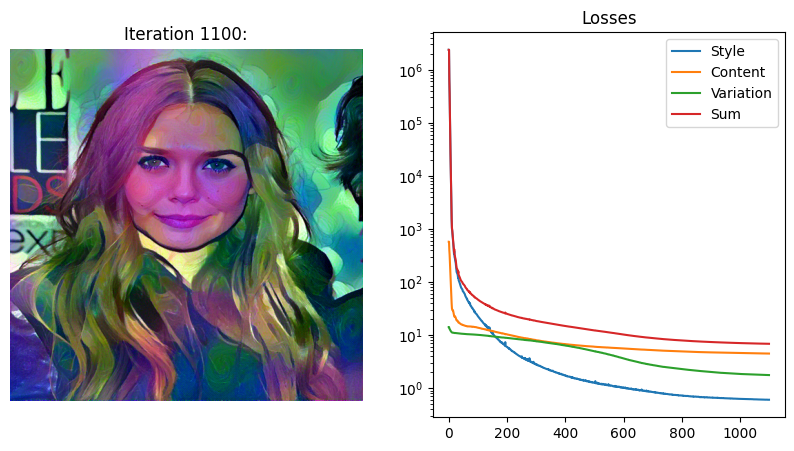

Style Loss : 0.602949 Content Loss: 4.474657 Variation Loss: 1.758634 Sum: 6.836240


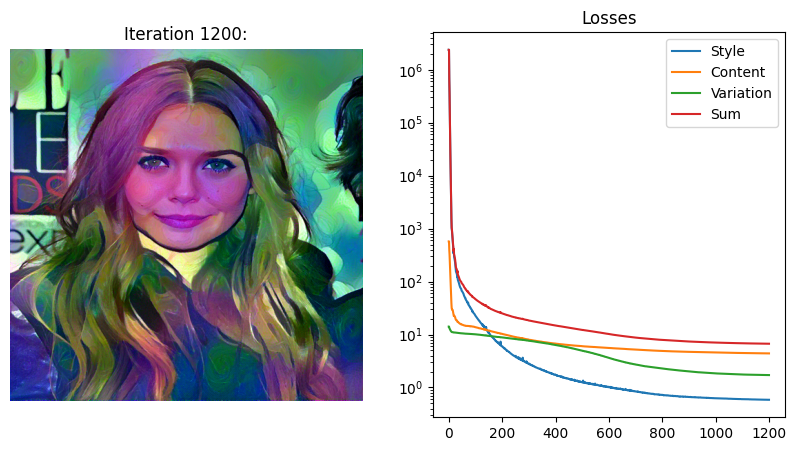

Style Loss : 0.586358 Content Loss: 4.401527 Variation Loss: 1.715161 Sum: 6.703045


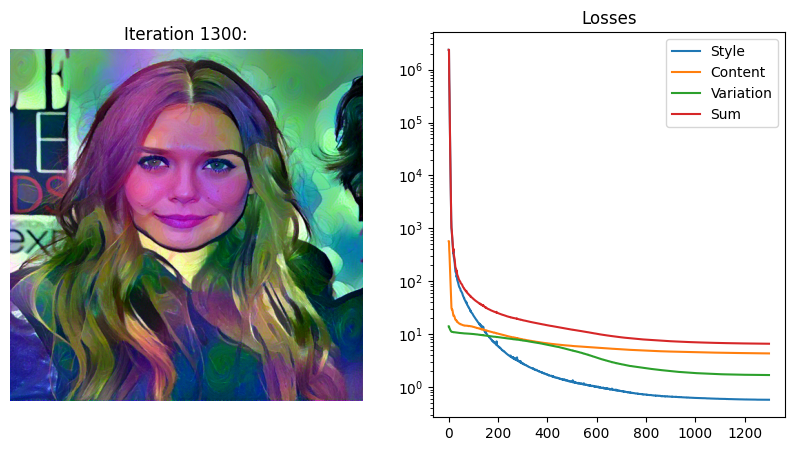

Style Loss : 0.578363 Content Loss: 4.342795 Variation Loss: 1.694746 Sum: 6.615904


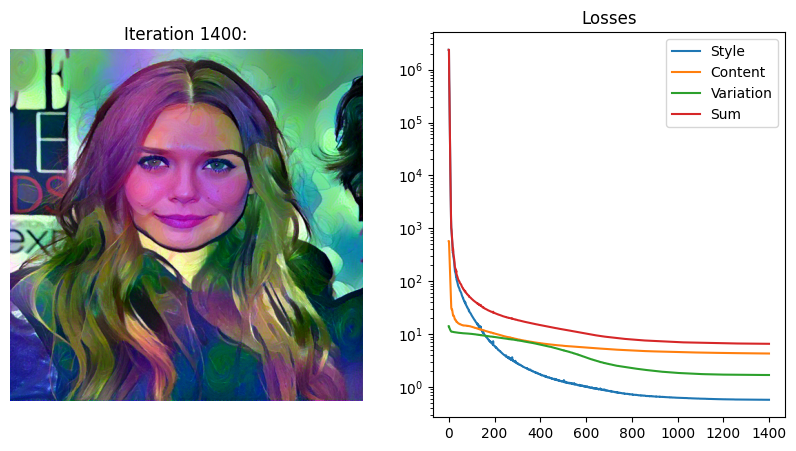

Style Loss : 0.573503 Content Loss: 4.297550 Variation Loss: 1.685901 Sum: 6.556954


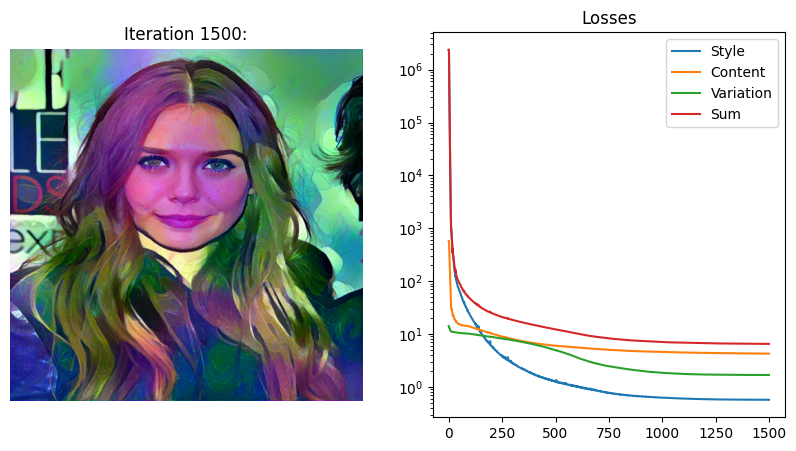

Style Loss : 0.571282 Content Loss: 4.262016 Variation Loss: 1.681292 Sum: 6.514590


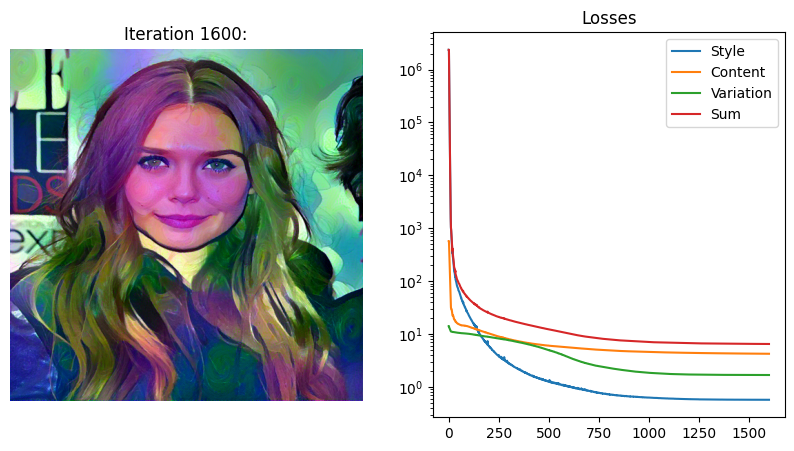

Style Loss : 0.570599 Content Loss: 4.230722 Variation Loss: 1.677472 Sum: 6.478794


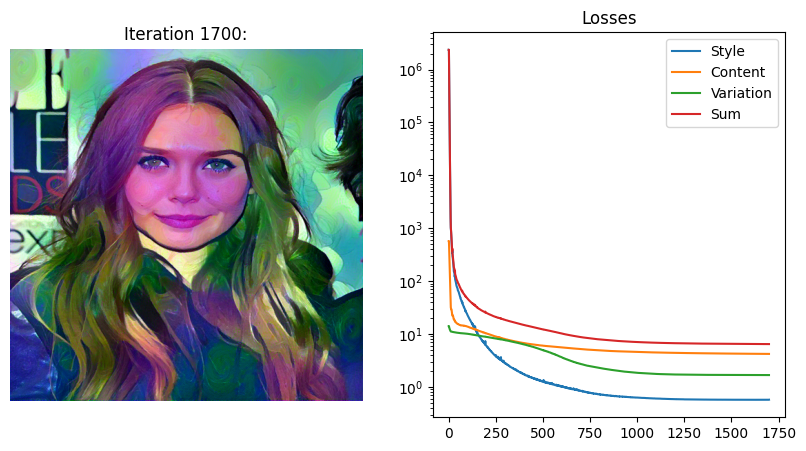

Style Loss : 0.572155 Content Loss: 4.202934 Variation Loss: 1.673205 Sum: 6.448294


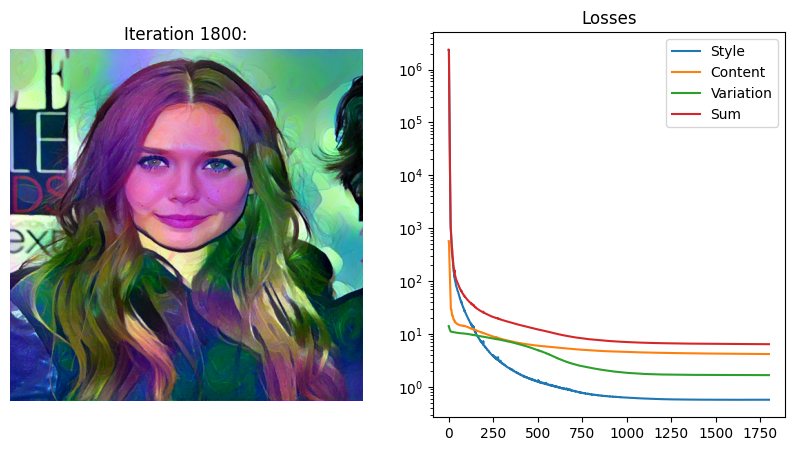

Style Loss : 0.571450 Content Loss: 4.180579 Variation Loss: 1.668988 Sum: 6.421018


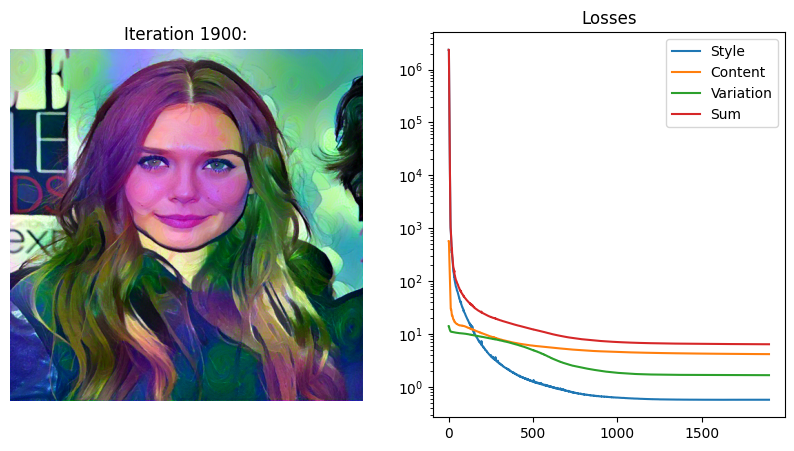

Style Loss : 0.571155 Content Loss: 4.164204 Variation Loss: 1.665308 Sum: 6.400667


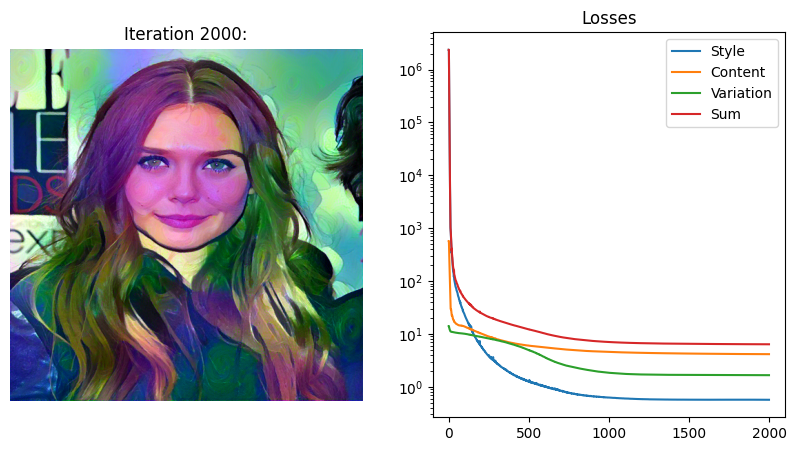

Style Loss : 0.569442 Content Loss: 4.151947 Variation Loss: 1.662228 Sum: 6.383618


In [21]:
print('Building the style transfer model..')
model, style_losses, content_losses = get_model_and_losses(style_img, content_img)
optimizer = get_input_optimizer(input_img)

print('Optimizing..')
iterations = 0
history=[]
while iterations <= ITERATIONS * 100:
  def closure():
      global history
      global iterations

      optimizer.zero_grad()

      # Compute the total variation loss
      variation_score = total_variation_loss(input_img) * TOTAL_VARIATION_WEIGHT

      model(input_img)

      style_score = sum(sl.loss for sl in style_losses)
      style_score *= STYLE_WEIGHT / len(style_losses)
      content_score = sum(cl.loss for cl in content_losses)
      content_score *= CONTENT_WEIGHT / len(content_losses)

      loss = style_score + content_score + variation_score
      # Save the value of loss in order to draw them as a graph
      history += [[style_score.item(), content_score.item(), variation_score.item(), loss.item()]]

      iterations += 1
      if iterations % 100 == 0:
          show_evolution(input_img.data.clone().detach().clamp(0, 1), history, title="Iteration %d:" % iterations)

      loss.backward()
      return loss

  optimizer.step(closure)

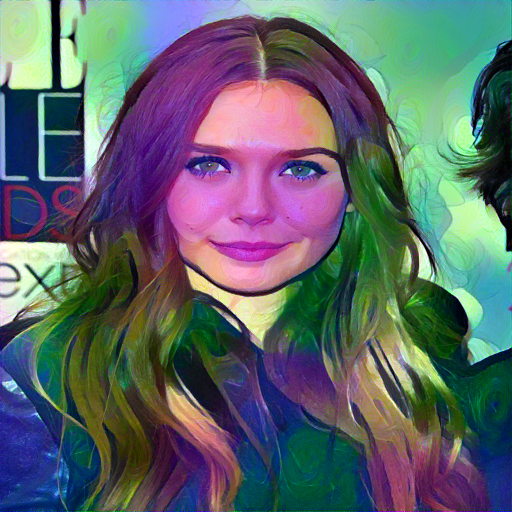

In [25]:
#@title result
img = tensor_to_image(input_img)
img

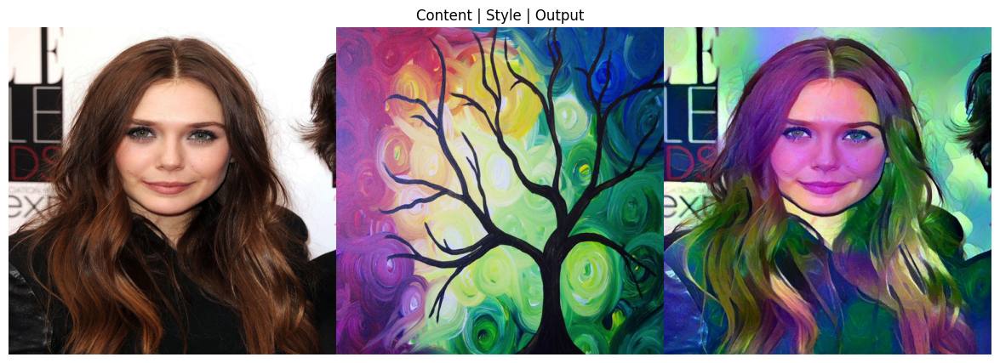

In [29]:
output_path = '/content/drive/MyDrive/Colab Notebooks/result.jpg'
img.save(output_path)

# Define image dimensions (assumes all images have the same size)
IMAGE_WIDTH = 512
IMAGE_HEIGHT = 512

def resize_image(image, target_width, target_height):
    return image.resize((target_width, target_height), Image.Resampling.LANCZOS)

# Create a new blank image to combine the resized images
combined = Image.new("RGB", (IMAGE_WIDTH * 3, IMAGE_HEIGHT))

# Load, resize, and paste images side-by-side
x_offset = 0
for image_path in [content_path, style_path, output_path]:
    image = Image.open(image_path)
    resized_image = resize_image(image, IMAGE_WIDTH, IMAGE_HEIGHT)
    combined.paste(resized_image, (x_offset, 0))
    x_offset += IMAGE_WIDTH

# Save the combined image
combined.save(combined_image_path)

# Display the combined image
plt.figure(figsize=(15, 5))  # Adjust figure size to match image dimensions
plt.imshow(combined)
plt.axis("off")  # Hide axes for better display
plt.title("Content | Style | Output")
plt.show()